<p align="center">
  <img width="300" height="290" src="https://i.imgur.com/mu6ZuGT.jpg">
</p>

<h1><b>TC4033</b></h1>
<h1><b>Visión computacional para imágenes y video</b></h1>
<h3><b>6.4 Google Colab - Extracción de líneas con algoritmo de Canny</b></h3>
<h3><b>Docentes:</b> Dr. Gilberto Ochoa Ruiz, Mtra. María Guadalupe Marcos Abularach</h3>

<h2><b>Equipo 30:</b></h2>

- Julio Baltazar Colín: A01794476
- Helmy Andrea Moreno Navarro: A01793918
- Maricel Parra Osorio - A01793932
- Yeison Fernando Villamil Franco: A01793803


# **3. Sobel and Canny Edge Detection**

## **Table of Contents**

[Introducción](#intro)
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

##**Introducción**

> En esta práctica de procesamiento de imágenes, desarrollaremos una práctica con el algoritmo de **Canny** para la extracción de líneas, utilizando herramientas como **OpenCV y Python**. Nuestro objetivo principal radica en comprender cómo los ajustes de parámetros, especialmente sigma, **influyen en la efectividad y precisión** de este algoritmo fundamental.

> A través de la experimentación y el análisis detallado de diversas imágenes, exploramos cómo la variación de sigma afecta tanto **la suavidad de la imagen** como** la capacidad del algoritmo para detectar bordes con precisión**. Este ejercicio nos permite no solo entender el funcionamiento interno del algoritmo de Canny, sino también **extraer conclusiones valiosas** que informarán futuras decisiones en el procesamiento de imágenes.

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage import convolve
from scipy.ndimage import gaussian_filter as gauss
from scipy.ndimage import median_filter as med
from io import BytesIO
import requests



In [ ]:
def display(dict=None, nrow=None, ncol=None, xsz=15, ysz=7 ):

    fig = plt.figure(figsize=(xsz,ysz))

    # Ajusta los márgenes y el espaciado entre subplots
    # plt.subplots_adjust(#left=0.05, right=0.15,
    #                     #bottom=0.05, top=0.05,
    #                     wspace=0.01, hspace=0.01)


    for raw, col in enumerate(dict):

        plt.subplot(nrow,ncol,raw+1)
        plt.title(f'{col}')
        plt.imshow(dict[col], "gray")

In [ ]:
def display_images(image_dict, nrow, ncol, xsz=15, ysz=7,):
    """
    Muestra imágenes en un diccionario en una cuadrícula de subplots.

    Parámetros:
    - image_dict: Diccionario de imágenes donde las claves son los títulos de las imágenes y los valores son las propias imágenes.
    - nrow: Número de filas en la cuadrícula de subplots.
    - ncol: Número de columnas en la cuadrícula de subplots.
    - xsz: Tamaño del plot en el eje x.
    - ysz: Tamaño del plot en el eje y.
    - hspace: Espacio vertical entre los subplots.
    """

    fig, axes = plt.subplots(nrow, ncol, figsize=(xsz, ysz))

    # Ajustar el espaciado entre subplots
    plt.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.6, wspace=0.1, hspace=0.1)

    # Iterar sobre el diccionario de imágenes y mostrar en subplots
    for (title, image), ax in zip(image_dict.items(), axes.ravel()):
        ax.imshow(image, cmap='gray')  # Mostrar la imagen en escala de grises
        ax.set_title(title)  # Establecer el título del subplot
        ax.set_xticks([])  # Remover las escalas numéricas del eje x
        ax.set_yticks([])  # Remover las escalas numéricas del eje y

    # Ocultar subplots restantes si hay menos imágenes que subplots
    for ax in axes.ravel()[len(image_dict):]:
        ax.axis('off')

    plt.show()

In [ ]:
def imagen_desde_url(url):
  response = requests.get(url)
  img_data = BytesIO(response.content)

  # Convertir los datos a una matriz de imagen
  image = cv2.imdecode(np.frombuffer(img_data.read(), np.uint8), 1)

  image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

  return image

In [ ]:
# URL del archivo npy
def arreglo_desde_url(url):
    # Obtener los datos desde la URL
    response = requests.get(url)

    # Leer el arreglo de NumPy desde los datos descargados
    np_array = np.load(BytesIO(response.content))

    return np_array



## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values.

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions.
3. Compute the magnitude of the gradient.
4. Normalize the gradient values.

In [ ]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

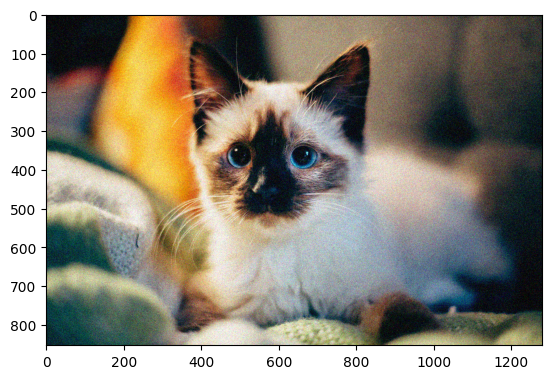

In [ ]:
# original_image = np.load('data/img.npy')
original_image = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_2/kitty-baseline.jpg?raw=true")
img = skimage.util.random_noise(original_image)
plt.imshow(img)

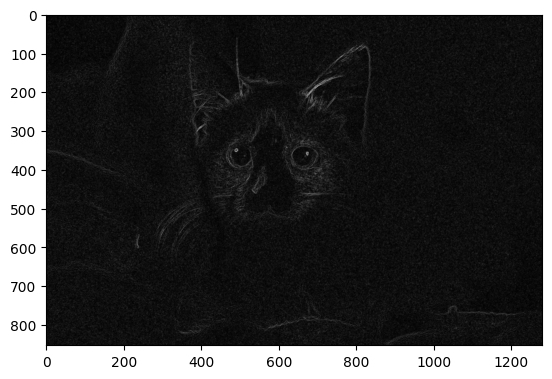

In [ ]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

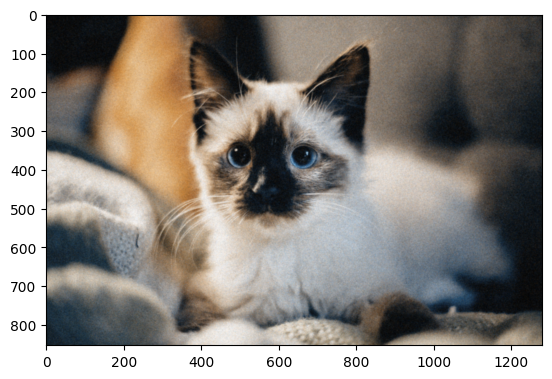

In [ ]:
img_gauss = gauss(img, sigma=1)
plt.imshow(img_gauss)

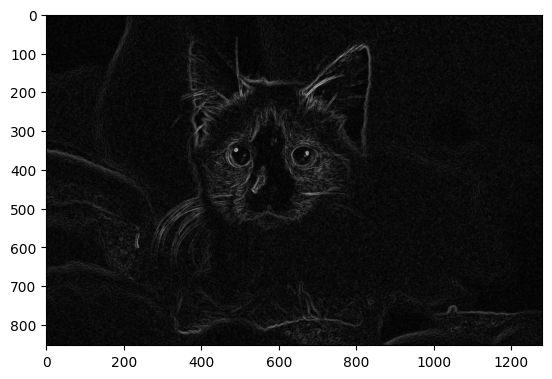

In [ ]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

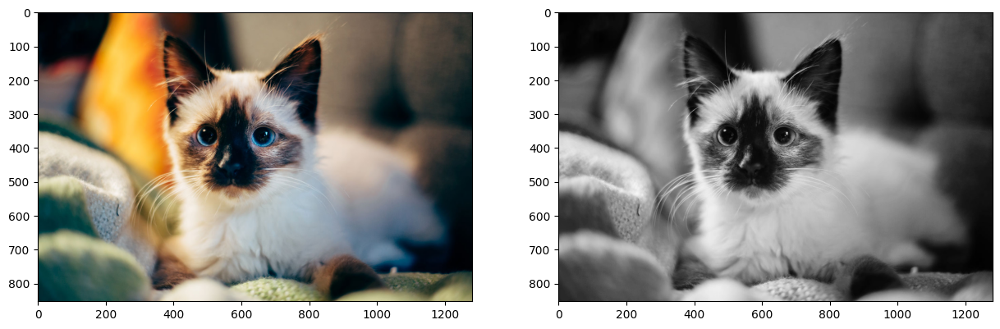

In [ ]:
#img = cv2.imread('data/image.jpg')
img = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_2/kitty-baseline.jpg?raw=true")
#img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_color = img
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [ ]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [ ]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [ ]:
kernel_size = 3

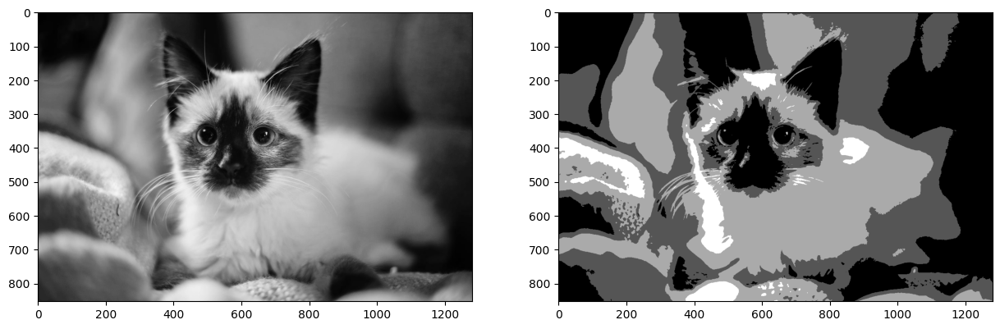

In [ ]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity.

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions:
- horizontal $(x)$
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [ ]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = convolve(img, Kx)
    Iy = convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

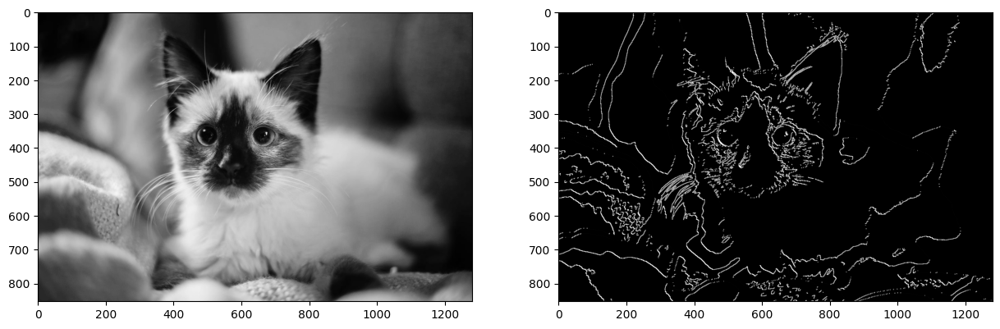

In [ ]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [ ]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

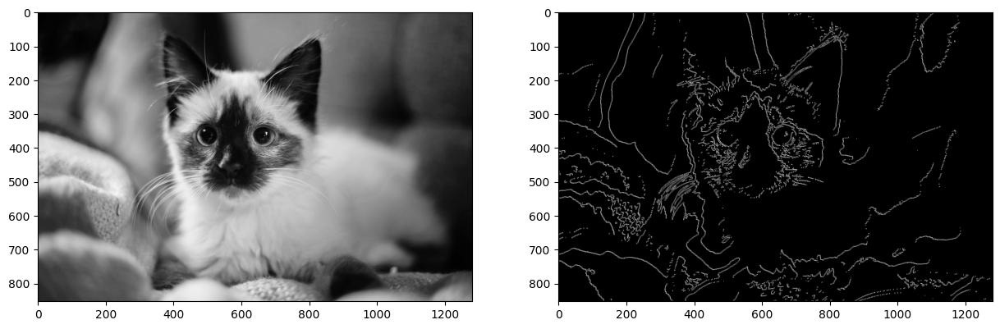

In [ ]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [ ]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):

    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(25)
    strong = np.int32(255)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)

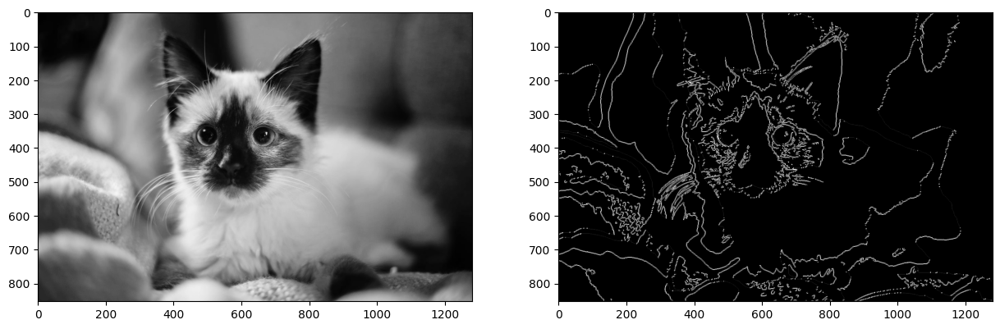

In [ ]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [ ]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

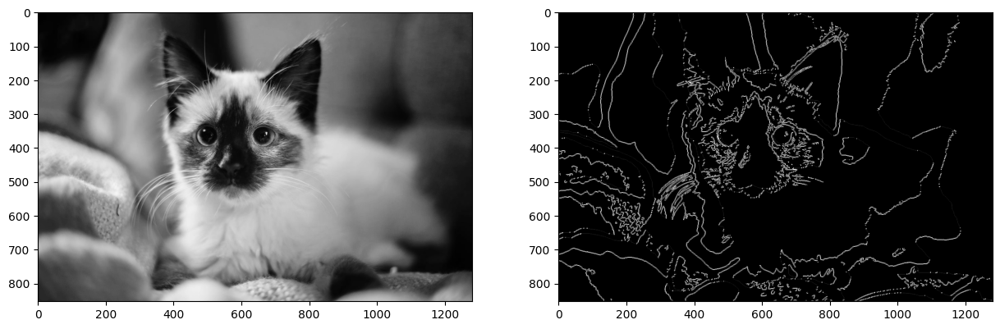

In [ ]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

In [ ]:
# TODO: Challenge

In [ ]:

def canny_detector(image, kernel_size=3, sigma=10, apply=True):
    """
    Aplica el algoritmo de Canny para detectar bordes en una imagen.

    Parámetros:
    - image: La imagen de entrada en formato BGR.
    - kernel_size: Tamaño del kernel para el suavizado gaussiano (valor impar).
    - sigma: Desviación estándar para el suavizado gaussiano.
    - apply: Indica si se debe aplicar el suavizado gaussiano.

    Retorna:
    - imagen_gris: Imagen procesada con el algoritmo de Canny.
    """
    # Convertir la imagen a escala de grises
    imagen_gris = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Crear el kernel gaussiano
    g = gaussian_kernel(kernel_size, sigma)

    # Aplicar el suavizado gaussiano si apply es True
    if apply:
        imagen_gris = convolve(imagen_gris, g)

    # Calcular el gradiente de la imagen
    G, theta = sobel_filters(imagen_gris)

    # Aplicar la supresión de no máximos
    img_nonmax = non_max_suppression(G, theta)

    # Aplicar la umbralización
    img_threshold = threshold(img_nonmax)

    # Aplicar la histeresis
    img_hist = hysteresis(img_threshold)

    # Devolver la imagen procesada
    return img_hist


# **Challenge**

## **a) Modifica el valor de sigma y observa los cambios en las lineas detectas**

> Con el objetivo de poder reducir la cantidad de pasos a seguir en el proceso de poder extraer las líneas con la variación del hiperparámetro sigma, se ha construído una clase que permita de manera sencilla poder extraer la información necesaria y reducir la cantidad de código

In [ ]:
from ClassCannyAlgorithm import canny

In [ ]:
# Cargar la imagen desde la URL proporcionada
original_image = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_2/kitty-baseline.jpg?raw=true")

# Agregar ruido aleatorio a la imagen cargada
img = skimage.util.random_noise(original_image)

# Mostrar la imagen resultante
plt.imshow(img)

Se verificará de manera sencilla la lectura y visualización de una imagen, con su posterior aplicación del algoritmo de Canny

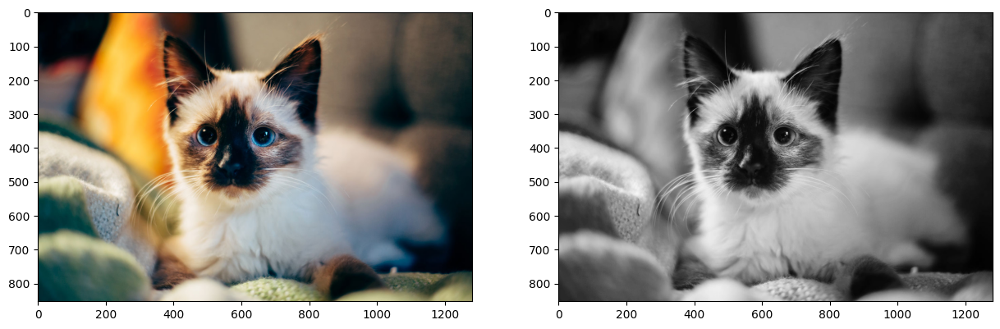

In [ ]:
# Cargar la imagen desde la URL proporcionada
img = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_2/kitty-baseline.jpg?raw=true")

# Crear una copia de la imagen a color
img_color = img

# Convertir la imagen a escala de grises utilizando OpenCV
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Configurar el tamaño de la figura para la visualización
plt.figure(figsize=(15, 8))

# Mostrar la imagen a color en el primer subplot
plt.subplot(1, 2, 1)
plt.imshow(img_color)

# Mostrar la imagen en escala de grises en el segundo subplot
plt.subplot(1, 2, 2)

# Mostrar la figura con ambas imágenes
plt.imshow(img_gray, cmap="gray")

In [ ]:
sigma = 10
kernel_size = 3

img_canny = canny(img_gray, sigma, kernel_size).hysteresis()

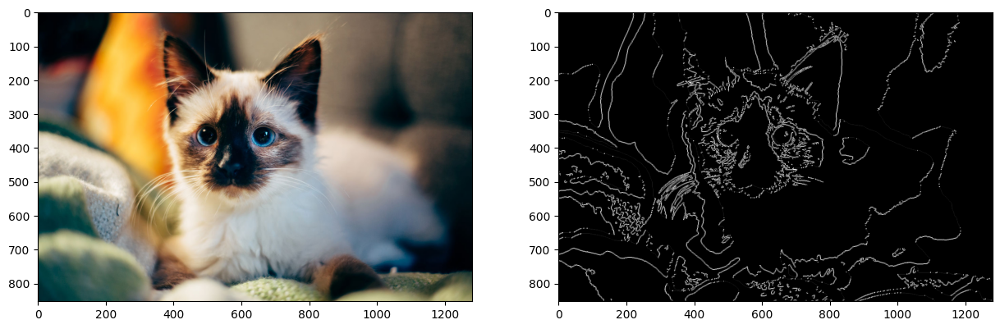

In [ ]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_canny, cmap="gray")

Una vez comprobado que la aplicación de la clase se realiza de manera correcta, se procede a realizar las variaciones en el valor de sigma y verificar la forma en que se producen las diferentes imágenes

In [ ]:
def display(dict=None, nrow=None, ncol=None, xsz=15, ysz=7):

    fig = plt.figure(figsize=(xsz,ysz))

    for raw, col in enumerate(dict):

        plt.subplot(nrow,ncol,raw+1)
        plt.title(f'{col}')
        plt.imshow(dict[col], "gray")

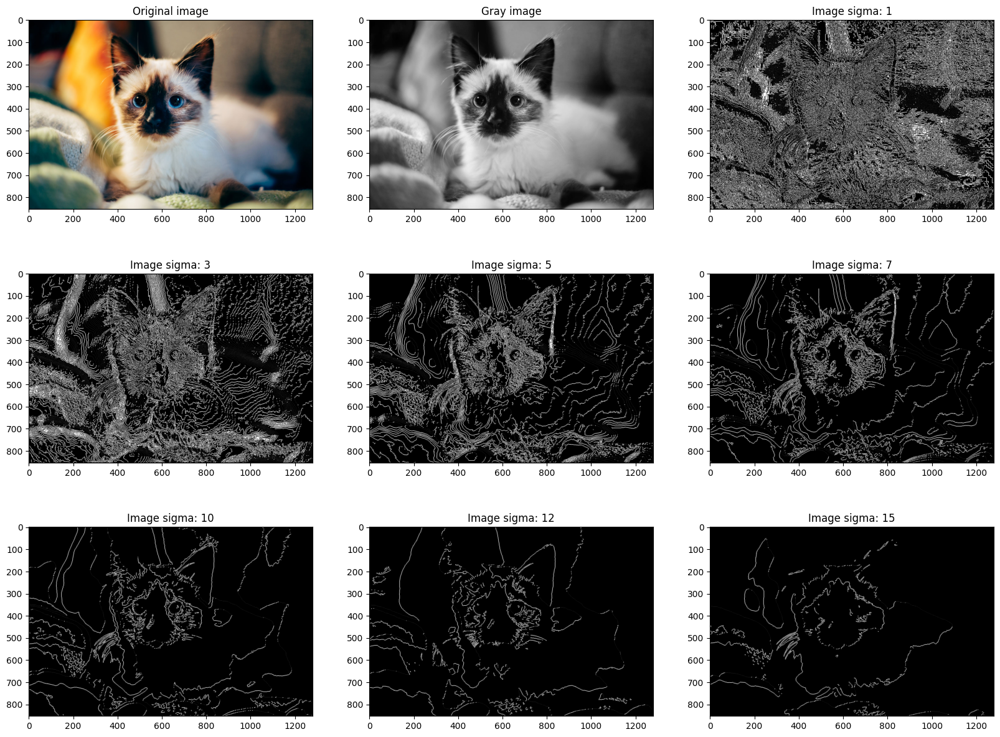

In [ ]:
dict_images = {
    "Original image": img_color,
    "Gray image": img_gray,
    f"Image sigma: {1}": canny(img_gray, 1, kernel_size).hysteresis(),
    f"Image sigma: {3}": canny(img_gray, 3, kernel_size).hysteresis(),
    f"Image sigma: {5}": canny(img_gray, 5, kernel_size).hysteresis(),
    f"Image sigma: {7}": canny(img_gray, 7, kernel_size).hysteresis(),
    f"Image sigma: {10}": canny(img_gray, 10, kernel_size).hysteresis(),
    f"Image sigma: {12}": canny(img_gray, 12, kernel_size).hysteresis(),
    f"Image sigma: {15}": canny(img_gray, 15, kernel_size).hysteresis()
}
display(dict_images, nrow=3, ncol=3, xsz=20, ysz=15)


### **Conclusiones de los cambios en las lineas detectas cuando se modifica el valor de sigma**

Se realizaron variaciones en los valores de sigma para la imagen cargada como ejemplo, con el fin de evidencias el impacto en cada una de estas, a continuación se mencionan los resultados:

- Impacto en la detección de bordes: A medida que aumenta el valor de sigma, se suaviza la imagen más agresivamente antes de aplicar el algoritmo de detección de bordes. Esto resulta en una pérdida gradual de detalles finos en la imagen.

- Sensibilidad a los detalles: Valores bajos de sigma, como 1 o 3, conservan muchos detalles finos y líneas específicas en la imagen, lo que puede ser útil para aplicaciones que requieren una alta precisión en la detección de bordes.

- Optimización de sigma: El rango entre 5 y 10 parece ser un punto óptimo en este caso particular. Estos valores muestran un equilibrio entre la suavidad de la imagen y la retención de detalles relevantes. Esto sugiere que, para esta imagen específica, un sigma en este rango podría ser una elección adecuada para resaltar características importantes sin perder demasiados detalles.

- Valor máximo de sigma: A medida que sigma supera cierto umbral, como 15 en este caso, la imagen resultante tiende a perder muchos detalles y las líneas detectadas se vuelven menos específicas. Esto indica que elegir un valor de sigma demasiado alto puede no ser beneficioso y podría resultar en una pérdida significativa de información importante en la imagen.

Finalmente, podemos decir que la elección del valor de sigma en el algoritmo de Canny tiene un impacto significativo en la calidad y la cantidad de detalles detectados en la imagen. Es importante encontrar un equilibrio que permita resaltar características importantes mientras se minimiza la pérdida de información relevante. En este caso, valores en el rango de 5 a 10 parecen ser una elección adecuada para esta imagen específica. Sin embargo, la selección óptima de sigma puede variar según la naturaleza de la imagen y los requisitos específicos de la aplicación.

## **b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido**

In [ ]:
# Cargar las tres imágenes desde las URL proporcionadas
img1 = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_2/kitty-baseline.jpg?raw=true")
img2 = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_6/rupestre.jpg?raw=true")
img3 = imagen_desde_url("https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_2/alebrije.jpg?raw=true")

# Definir los valores de sigma para el suavizado gaussiano
sigma1 = 11
sigma2 = 15
sigma3 = 12

# Convertir cada imagen a escala de grises utilizando OpenCV
img1_g = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_g = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img3_g = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

# Aplicar el suavizado gaussiano a cada imagen utilizando la función convolve con un kernel gaussiano
img1_nr = convolve(img1_g, gaussian_kernel(size=3, sigma=sigma1))
img2_nr = convolve(img2_g, gaussian_kernel(3, sigma2))
img3_nr = convolve(img3_g, gaussian_kernel(5, sigma3))

# Aplicar el detector de bordes Canny a cada imagen, pero solo obtener el resultado sin aplicar el detector
img1_cr = canny_detector(img1, sigma=sigma1, apply=False)
img2_cr = canny_detector(img2, sigma=sigma2, apply=False)
img3_cr = canny_detector(img3, sigma=sigma3, apply=False)

# Aplicar el detector de bordes Canny a cada imagen y obtener el resultado aplicando el detector
img1_cf = canny_detector(img1, sigma=sigma1, apply=True)
img2_cf = canny_detector(img2, sigma=sigma2, apply=True)
img3_cf = canny_detector(img3, sigma=sigma3, apply=True)


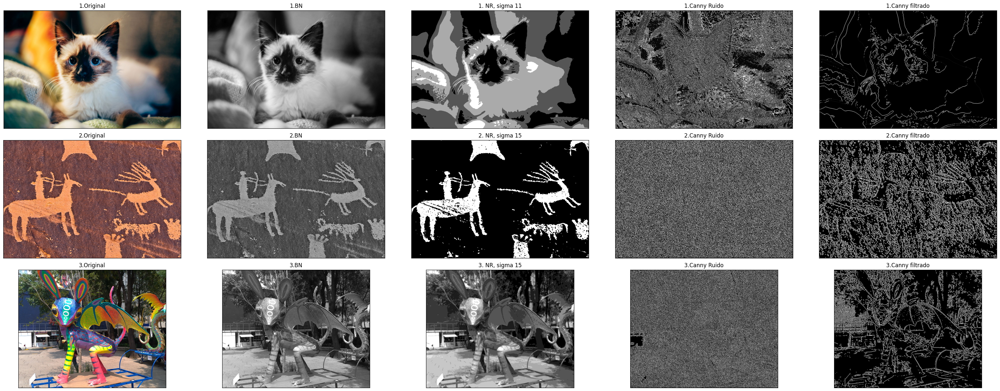

In [ ]:
dict_images ={
    "1.Original":              img1,
    "1.BN":                    img1_g ,
   f"1. NR, sigma {sigma1}":   img1_nr,
    "1.Canny Ruido":           img1_cr,
    "1.Canny filtrado":        img1_cf,

    "2.Original":              img2,
    "2.BN":                    img2_g,
   f"2. NR, sigma {sigma2}":   img2_nr,
    "2.Canny Ruido":           img2_cr,
    "2.Canny filtrado":        img2_cf,

    "3.Original":              img3,
    "3.BN":                    img3_g,
   f"3. NR, sigma {sigma2}":   img3_nr,
    "3.Canny Ruido":           img3_cr,
    "3.Canny filtrado":        img3_cf,
}
display_images(dict_images, nrow=3, ncol=5, xsz = 34, ysz = 21)

### **Conclusiones de la aplicación del operador de Canny con y sin remoción de ruido:**

Aplicar el operador de Canny con y sin remoción de ruido puede tener diferentes efectos en el resultado final de la detección de bordes, dependiendo de las características de la imagen y la cantidad de detalles finos que posea.

> Con Remoción de Ruido:

* Al aplicar un paso de remoción de ruido antes de la detección de bordes con el operador de Canny, como por ejemplo mediante un filtro gaussiano, se puede mejorar la calidad de los bordes detectados.

* La remoción de ruido ayuda a eliminar o reducir los efectos del ruido en la imagen, lo que puede resultar en una detección de bordes más precisa y menos propensa a falsos positivos.

> Sin Remoción de Ruido:

* Aplicar el operador de Canny sin remover el ruido puede resultar en una imagen con ruido gaussiano prácticamente indistinguible o en detección de bordes menos precisa.

* El ruido presente en la imagen puede causar que el algoritmo de detección de bordes identifique bordes falsos o irrelevantes, lo que puede afectar la calidad del resultado final.

En imágenes con poco ruido como ilustraciones con colores sólidos, la remoción de ruido puede no ser necesaria y aplicar el operador de Canny directamente a la imagen original puede ser suficiente para obtener buenos resultados.

Aplicar el operador de Canny sin reducción de ruido puede ser útil también en aplicaciones de CGI para generar mapas de relieve para aumentar las texturas.

## **c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo**

In [ ]:
def plot_images_cambiosSigma(original, *images):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, len(images) + 1, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original')
    plt.axis('off')

    for i, img_data in enumerate(images):
        plt.subplot(1, len(images) + 1, i + 2)
        plt.imshow(img_data['img'], cmap='gray')
        plt.title(img_data['title'])
        plt.axis('off')

    plt.show()

In [ ]:
# Carga las imágenes desde las URL
url_color_1 = "https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_6/ave.jpg?raw=true"
url_color_2 = "https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_6/peluche_3.jpg?raw=true"
url_gray = "https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_6/Cebra.jpg?raw=true"
url_gray_2 = "https://github.com/yeivillamil/Team30_CV/blob/main/data/semana_6/flor_gris.jpg?raw=true"

img_color_1 = imagen_desde_url(url_color_1)
img_color_2 = imagen_desde_url(url_color_2)
img_gray = imagen_desde_url(url_gray)
img_gray_2 = imagen_desde_url(url_gray_2)

# Aplica el detector de Canny con diferentes sigmas
# sigmas = [(3, 5), (5, 25), (10, 55), (15, 75), (20, 100)]
# sigmas = [(2, 5), (5, 10), (10, 20), (20, 50), (40, 100)]
sigmas = [(2, 5), (5, 10), (10, 20), (15, 50), (17, 100)]
noisy_images_color_1 = []
noisy_images_color_2 = []
noisy_images_gray = []
noisy_images_gray_2 = []


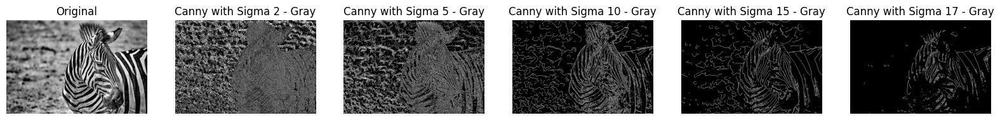

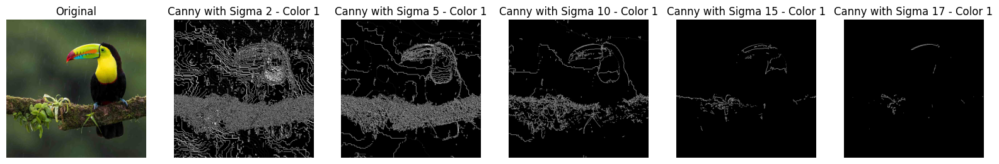

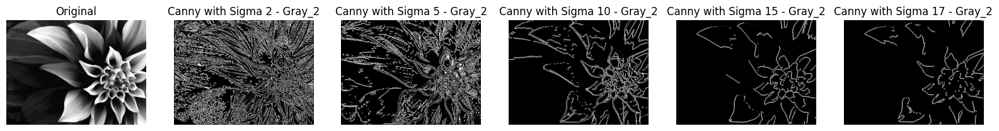

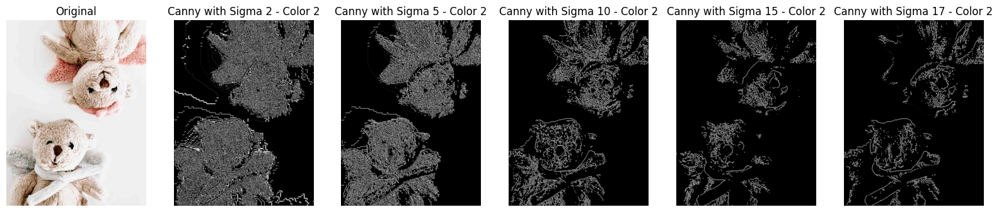

In [ ]:
for sigma in sigmas:
    noisy_img_color_1 = canny_detector(img_color_1, sigma=sigma[0])
    title_color_1 = f"Canny with Sigma {sigma[0]} - Color 1"
    noisy_images_color_1.append({"img": noisy_img_color_1, "title": title_color_1})

    noisy_img_color_2 = canny_detector(img_color_2, sigma=sigma[0])
    title_color_2 = f"Canny with Sigma {sigma[0]} - Color 2"
    noisy_images_color_2.append({"img": noisy_img_color_2, "title": title_color_2})

    noisy_img_gray = canny_detector(img_gray, sigma=sigma[0])
    title_gray = f"Canny with Sigma {sigma[0]} - Gray"
    noisy_images_gray.append({"img": noisy_img_gray, "title": title_gray})

    noisy_img_gray_2 = canny_detector(img_gray_2, sigma=sigma[0])
    title_gray_2 = f"Canny with Sigma {sigma[0]} - Gray_2"
    noisy_images_gray_2.append({"img": noisy_img_gray_2, "title": title_gray_2})

# Muestra las imágenes
plot_images_cambiosSigma(img_gray, *noisy_images_gray)
plot_images_cambiosSigma(img_color_1, *noisy_images_color_1)
plot_images_cambiosSigma(img_gray_2, *noisy_images_gray_2)
plot_images_cambiosSigma(img_color_2, *noisy_images_color_2)

### **Conclusiones punto c**

<p align="center">
<b>Parámetros: # sigmas = [(2, 5), (5, 10), (10, 20), (20, 50), (40, 100)]</b>
  <img width="600"  src="https://i.imgur.com/R11r7hw.jpeg">
</p>


<p align="center">
<b>Parámetros: # sigmas = [(3, 5), (5, 25), (10, 55), (15, 75), (20, 100)]</b>
  <img width="600"  src="https://i.imgur.com/FOzm9zV.jpeg">
</p>






Después de observar el comportamiento del algoritmo de detección de bordes de Canny al experimentar con imágenes que poseen diferentes cantidades de líneas y texturas, variando los parámetros sigma, podemos sacar las siguientes conclusiones:

> Impacto de los parámetros sigma en imágenes con líneas y texturas definidas:

* Se observa que al incrementar el valor de sigma en las imágenes con líneas y texturas definidas, como la imagen de la cebra y la flor en escala de grises, se suavizan los bordes y detalles de manera más notable. Esto conduce a una pérdida gradual de la definición de las líneas y contornos en las imágenes, lo que puede resultar en una detección de bordes menos precisa.

> Diferencias entre imágenes en color y en escala de grises:

* Se aprecia que las imágenes en color, como las de las aves y los peluches, muestran una variación en la percepción de los bordes dependiendo de la cantidad y distribución de los colores en la imagen. Los bordes que se destacan pueden ser más suaves o más pronunciados según los colores presentes en la imagen y la forma en que se combinan.

> Influencia de los valores sigma en la detección de bordes:

* La elección de los valores de sigma impacta significativamente en la detección de bordes, donde combinaciones más altas de sigma tienden a suavizar los bordes, mientras que combinaciones más bajas pueden resaltar bordes más definidos. Es esencial seleccionar cuidadosamente los valores de sigma según las características específicas de la imagen y el nivel de detalle que se desee resaltar.

> Optimización de sigma:

* No existe una combinación única de valores de sigma que sea óptima para todas las imágenes.

* La elección de sigma dependerá de las características individuales de cada imagen, como la cantidad de detalles, la textura y la presencia de ruido.

Finalmente, podemos concluir que al experimentar con imágenes que tienen diferentes cantidades de líneas y texturas, variando los parámetros sigma, se observa que estos parámetros tienen un impacto significativo en la calidad y precisión de la detección de bordes. Es fundamental realizar pruebas exhaustivas y ajustar los valores de sigma según las características específicas de cada imagen para obtener resultados óptimos.

## **Conclusiones Generales**

Después de explorar y analizar el comportamiento del algoritmo de detección de bordes de Canny mediante la experimentación con imágenes de diferentes características y variando los parámetros sigma, podemos extraer algunas conclusiones generales:


> Impacto de Sigma en la Detección de Bordes:

* A medida que aumenta el valor de sigma, se suaviza la imagen de manera más pronunciada antes de aplicar el algoritmo de detección de bordes, lo que resulta en una pérdida gradual de detalles finos.

* Valores bajos de sigma conservan más detalles finos y líneas específicas en la imagen, mientras que valores altos tienden a suavizar los bordes, lo que puede resultar en una detección de bordes menos precisa.

> Sensibilidad a los Detalles:

* Los valores de sigma más bajos pueden ser útiles para aplicaciones que requieren una alta precisión en la detección de bordes, ya que conservan los detalles finos y las líneas específicas en la imagen.
Optimización de Sigma:

* El rango óptimo de valores de sigma puede variar según la naturaleza específica de la imagen y el nivel de detalle que se desee resaltar.
En el caso específico analizado, valores en el rango de 5 a 10 mostraron un equilibrio adecuado entre la suavidad de la imagen y la retención de detalles relevantes.

> Remoción de Ruido:

* La remoción de ruido antes de aplicar el detector de bordes de Canny mejora la calidad de los bordes detectados, reduciendo la probabilidad de identificar bordes falsos o irrelevantes.

* Sin remoción de ruido, la detección de bordes puede ser menos precisa y más susceptible a errores debido al ruido presente en la imagen.

> Consideraciones Específicas de las Imágenes:

* La selección de los valores de sigma y la necesidad de remoción de ruido pueden variar según las características individuales de cada imagen, como la cantidad de líneas, texturas y detalles presentes, es decir, el comportamiento del algoritmo de detección de bordes de Canny es altamente sensible a los parámetros sigma y a la presencia de ruido en la imagen.

La evaluación tanto visual como cuantitativa utilizando métricas de precisión y recall resulta necesaria para validar rigurosamente el impacto de los parámetros sigma en la calidad de la detección de bordes por Canny. Si bien el análisis visual entrega intuiciones útiles, las métricas cuantitativas entregan validación más sólida.

Adicionalmente, los requerimientos específicos de la aplicación final deben orientar la optimización de parámetros de Canny. Por ejemplo, en sistemas médicos se priorizaría maximizar precisión para no pasar por alto detalles críticos.

En conclusión, el estudio del impacto de sigma sobre la detección de bordes mediante Canny nos entrega conocimientos valiosos para mejorar sistemas de procesamiento de imágenes en diversos contextos prácticos. Pero se requiere validación cuantitativa de resultados y ajuste contextualizado de parámetros según aplicación, para garantizar calidad, robustez y desempeño óptimo.

